In [6]:
from pathlib import Path
import shutil
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

caminho_atual = Path.cwd()
if caminho_atual.name == "notebooks":
    raiz_projeto = caminho_atual.parent
else:
    raiz_projeto = caminho_atual
pasta_dataset = raiz_projeto / "dataset" / "original" / "Dataset"
print(f"Dataset: {pasta_dataset}")

IMAGE_SIZE = (512, 512)

Dataset: c:\Users\Maria Clara\processamento-de-imagens\dataset\original\Dataset


In [2]:
def listar_imagens_raw(pasta_dataset):
    return sorted(list(pasta_dataset.rglob("*_RAW.jpg")))

def carregar_e_redimensionar(caminho, modo=cv2.IMREAD_COLOR, tamanho=IMAGE_SIZE):
    img = cv2.imread(str(caminho), modo)
    if img is None:
        raise ValueError(f"Erro ao carregar: {caminho}")
    return cv2.resize(img, tamanho)

def mostrar_lote(imagens_raw, inicio=0, quantidade=100, n_colunas=2):
    fim = min(inicio + quantidade, len(imagens_raw))
    imagens_lote = imagens_raw[inicio:fim]
    total = len(imagens_lote)
    n_linhas = math.ceil(total / n_colunas)
    print(f"Exibindo imagens {inicio} até {fim - 1} de {len(imagens_raw) - 1}")
    fig, axes = plt.subplots(n_linhas, n_colunas, figsize=(12, n_linhas * 4))
    axes = np.array(axes).reshape(-1)
    for ax in axes:
        ax.axis("off")
    for ax, (idx, caminho) in zip(axes, enumerate(imagens_lote, start=inicio)):
        img = carregar_e_redimensionar(caminho)
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(f"[{idx}] {caminho.name}", fontsize=9)
        ax.axis("off")
    plt.tight_layout()
    plt.show()

def encontrar_mascara(pasta_caso, tipo):
    mascaras = list(pasta_caso.glob(f"*_{tipo}.png"))
    if not mascaras:
        raise FileNotFoundError(f"Máscara {tipo} não encontrada em {pasta_caso}")
    return mascaras[0]

def carregar_mascara(caminho, tamanho=IMAGE_SIZE):
    img = cv2.imread(str(caminho), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Erro ao carregar máscara: {caminho}")
    return cv2.resize(img, tamanho)

def mostrar_selecionadas_multiclasse(imagens_raw, indices):
    n_linhas = len(indices)
    n_cols = 3
    fig, axes = plt.subplots(n_linhas, n_cols, figsize=(14, 4 * n_linhas))
    axes = np.atleast_2d(axes)
    for row, idx in enumerate(indices):
        if idx < 0 or idx >= len(imagens_raw):
            print(f"Índice inválido: {idx}")
            continue
        caminho_raw = imagens_raw[idx]
        pasta_caso = caminho_raw.parent
        raw = carregar_e_redimensionar(caminho_raw)
        crack = carregar_mascara(encontrar_mascara(pasta_caso, "CRACK"))
        pothole = carregar_mascara(encontrar_mascara(pasta_caso, "POTHOLE"))
        axes[row][0].imshow(cv2.cvtColor(raw, cv2.COLOR_BGR2RGB))
        axes[row][0].set_title(f"[{idx}] RAW")
        axes[row][0].axis("off")
        axes[row][1].imshow(crack, cmap="gray")
        axes[row][1].set_title("CRACK")
        axes[row][1].axis("off")
        axes[row][2].imshow(pothole, cmap="gray")
        axes[row][2].set_title("POTHOLE")
        axes[row][2].axis("off")
    plt.tight_layout()
    plt.show()

In [3]:
imagens_raw = listar_imagens_raw(pasta_dataset)
print(f"Dataset: {pasta_dataset}")
print(f"Total de imagens RAW encontradas: {len(imagens_raw)}")

Dataset: c:\Users\Maria Clara\processamento-de-imagens\dataset\original\Dataset
Total de imagens RAW encontradas: 2235


Avaliação de imagens por lotes de 100

In [ ]:
mostrar_lote(imagens_raw, inicio=2135, quantidade=100)

Seleção inicial de 30 imagens

In [56]:
indices_selecionados = [105, 161, 221, 244, 483, 484, 1346, 1460, 1546, 1724, 1790, 2055, 2056, 2076, 2099, 2100, 2116, 2130, 2171, 2172, 2174, 2175, 2176, 2177, 2179, 2182, 2214, 2215, 2227, 2233]

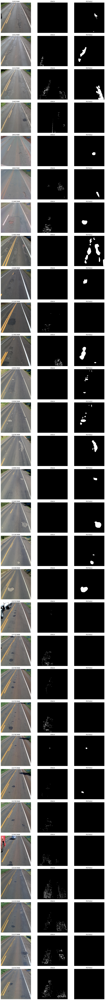

In [57]:
mostrar_selecionadas_multiclasse(imagens_raw, indices_selecionados)

Seleção de 10

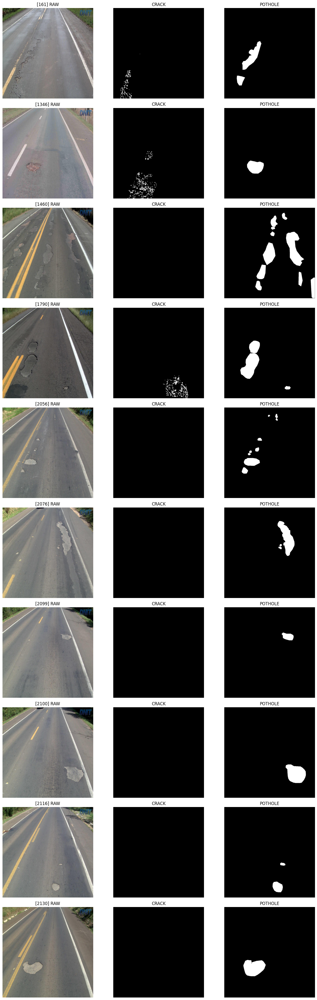

In [5]:
indices_10 = [161, 1346, 1460, 1790, 2056, 2076, 2099, 2100, 2116, 2130]
mostrar_selecionadas_multiclasse(imagens_raw, indices_10)

In [7]:
pasta_saida = raiz_projeto/"imagens"
pasta_saida.mkdir(exist_ok=True)
indices_para_salvar = indices_10
tipos = ["RAW", "LANE", "CRACK", "POTHOLE"]
for idx in indices_para_salvar:
    caminho_raw = imagens_raw[idx]
    pasta_caso = caminho_raw.parent
    pasta_imagem = pasta_saida / f"img_{idx}"
    pasta_imagem.mkdir(exist_ok=True)
    for tipo in tipos:
        arquivos = list(pasta_caso.glob(f"*_{tipo}.*"))
        if arquivos:
            shutil.copy2(arquivos[0], pasta_imagem / arquivos[0].name)

print(f"Arquivos em: {pasta_saida}")

Arquivos em: c:\Users\Maria Clara\processamento-de-imagens\imagens
